In [1]:
import xarray as xr
import matplotlib.pyplot as plt
import altair as alt
alt.data_transformers.disable_max_rows()
import datetime as dt
import numpy as np
from metpy.units import units
import pandas as pd
import rioxarray as rix

In [2]:
fn = "/Users/elischwat/Development/data/sublimationofsnow/lidar_rasters/l6_test_20230505_20230530_hourly.nc"

In [3]:
ds_lazy = xr.open_dataset(fn, chunks={
    'time': 1, 'x': 1000, 'y':1000
})

In [4]:
init_condition = ds_lazy.sel(
    # x = slice(-16, 26),
    # y = slice(-20, 16)
).sel(time = '20230505 0000')['surface']

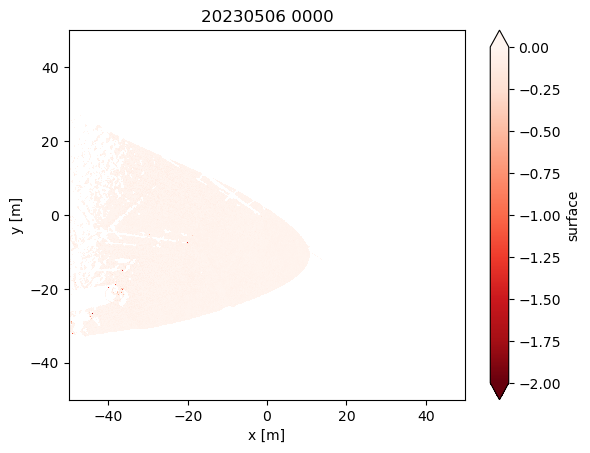

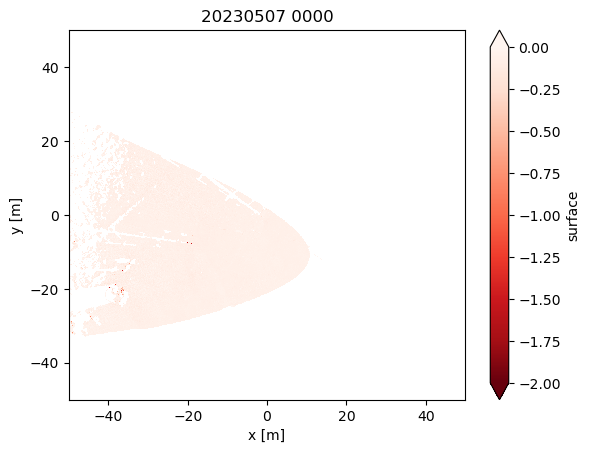

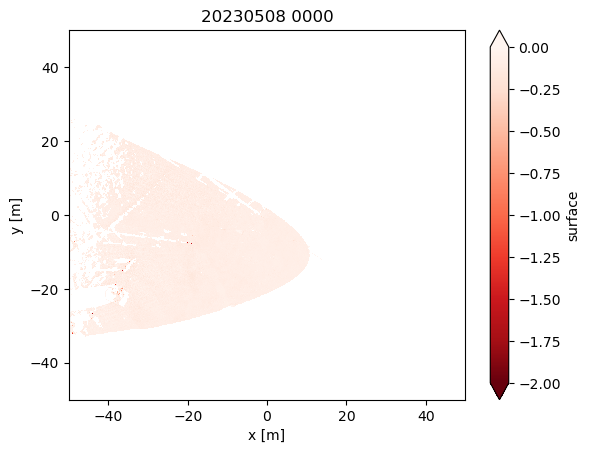

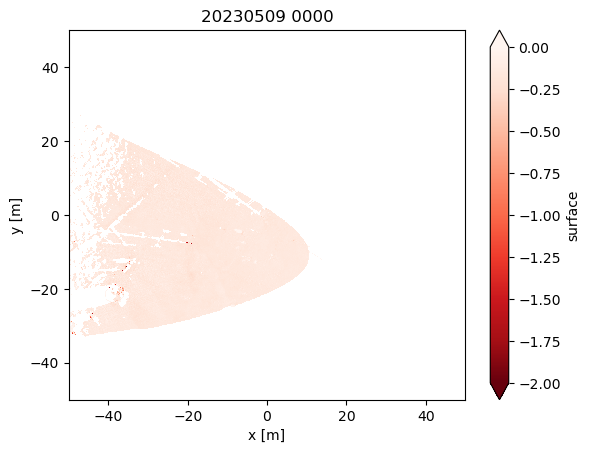

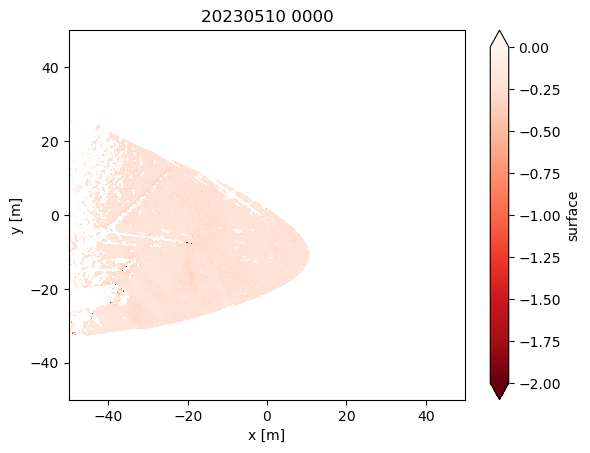

...

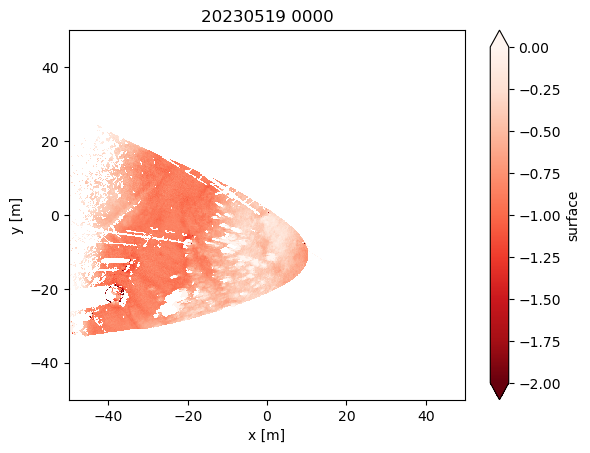

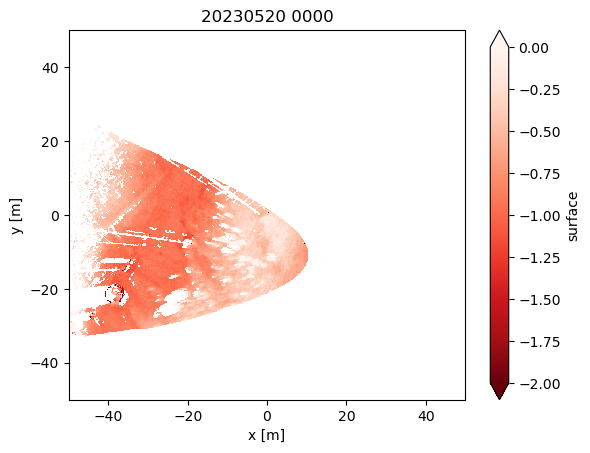

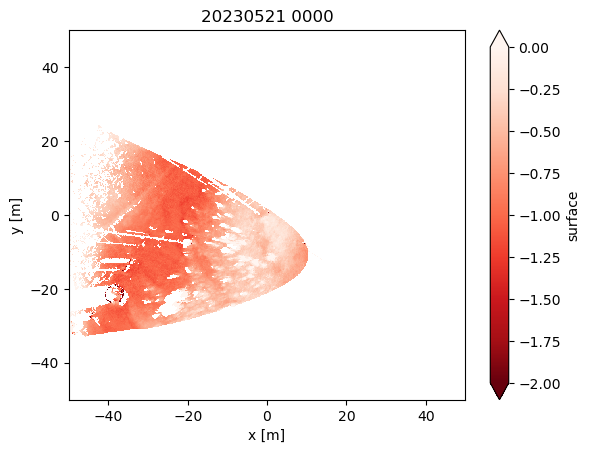

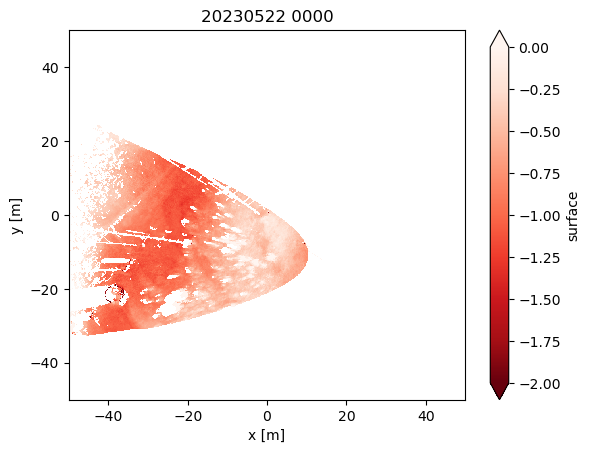

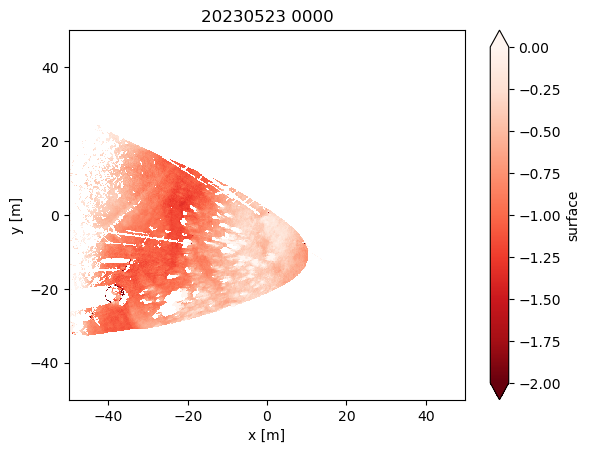

In [5]:
for date_str in [
    '20230506 0000',
    '20230507 0000',
    '20230508 0000',
    '20230509 0000',
    '20230510 0000',
    '20230511 0000',
    '20230512 0000',
    '20230513 0000',
    '20230514 0000',
    '20230515 0000',
    '20230516 0000',
    '20230517 0000',
    '20230518 0000',
    '20230519 0000',
    '20230520 0000',
    '20230521 0000',
    '20230522 0000',
    '20230523 0000',
]:
    (ds_lazy.sel(
        # x = slice(-16, 26),
        # y = slice(-20, 16)
    ).sel(time = date_str)['surface'] - init_condition).plot(vmin=-2, vmax=0, cmap='Reds_r')
    plt.title(date_str)
    plt.show()

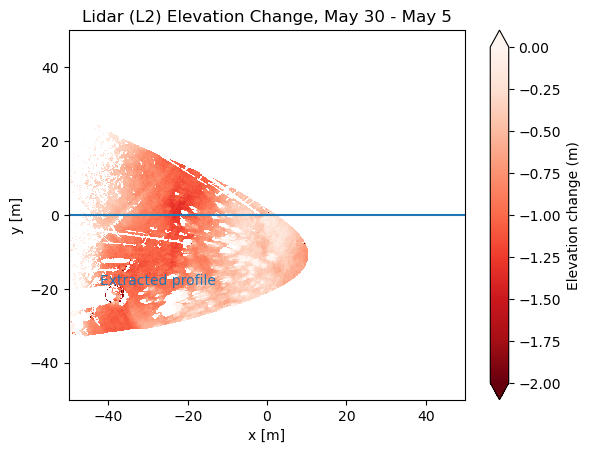

In [64]:
(
    ds_lazy.sel(time = ds_lazy.time[-1])['surface'] 
    - ds_lazy.sel(time = ds_lazy.time[0])['surface']
).plot(vmin=-2, vmax=0, cmap='Reds_r', cbar_kwargs={'label': 'Elevation change (m)'})
plt.title('Lidar (L6) Elevation Change, May 30 - May 5')
plt.axhline(0)
plt.text(-42, -19, "Extracted profile", color='tab:blue')  # Add text at x=-20, y=-20
plt.show()

In [65]:
ds_diff_lazy = ds_lazy.sel(time = slice(ds_lazy.time[1],  None)) - ds_lazy.sel(time = ds_lazy.time[0])

In [66]:
alt.Chart(
    ds_lazy.interp(y = 0).surface.to_dataframe().dropna().loc[::, ::10, ::].reset_index().dropna()
).mark_line().encode(
    alt.X('x:Q'),
    alt.Y('mean(surface):Q').scale(zero=False).title('Elevation (m)'),
    alt.Color('date(time):O').scale(scheme='turbo').legend(columns=2)
).properties(title = 'Lidar Absolute Elevation') | alt.Chart(
    ds_diff_lazy.interp(y = -20).surface.to_dataframe().dropna().loc[::, ::10, ::].reset_index().dropna()
).mark_line().encode(
    alt.X('x:Q'),
    alt.Y('mean(surface):Q').scale(zero=False).title('Elevation Change (m)'),
    alt.Color('date(time):O').scale(scheme='turbo').legend(columns=2).title('Day in May')
).properties(title = 'Lidar Elevation Change since May 5')

alt.HConcatChart(...)

In [102]:
alt.Chart(
    ds_lazy.interp(
        y = 0
    ).sel(
        x=slice(-38,-8),
        time=slice('20230515', '20230530')
    ).surface.to_dataframe().dropna().loc[
        ::, ::10, ::
    ].reset_index().dropna()
).mark_line().encode(
    alt.X('x:Q'),
    alt.Y('mean(surface):Q').scale(zero=False).title('Elevation (m)'),
    alt.Color('date(time):O').scale
    (scheme='turbo').legend(columns=2),
    tooltip='date(time)',
).properties(title = 'Lidar Absolute Elevation')

alt.Chart(...)

In [110]:
alt.Chart(
    ds_lazy.interp(
        y = 0
    ).sel(
        x=slice(-40,-8),
        time=slice('20230517 0600', '20230517 1700')
    ).surface.to_dataframe().dropna().loc[
        ::, ::2, ::
    ].reset_index().dropna()
).transform_window(
    rolling_avg = 'mean(surface)',
    frame=[5,5],
    groupby=['time'],
).mark_line().encode(
    alt.X('x:Q'),
    alt.Y('rolling_avg:Q').scale(zero=False).title('Elevation (m)'),
    alt.Color('time:O').scale(scheme='turbo').legend(columns=2)
).properties(title = 'Lidar Absolute Elevation')

alt.Chart(...)

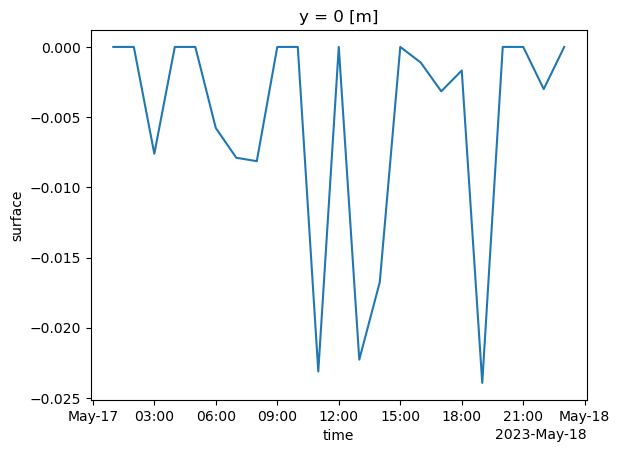

In [59]:
src1 = ds_lazy.interp(y = 0).sel(
    time = slice('20230517 0000', '20230517 2359'),
    x = slice(-35,-10)
).surface
src1 = src1.mean('x').compute()
src1 = src1.diff('time')
src1.where(src1 < 0, other=0).plot()
# src1.plot()

In [46]:
snowmelt_m_per_s = src1.where(src1 < 0, other=0).values / (60*60)
snow_density = 430 * units("kg/m^3")
specific_heat_of_fusion = 334 * units("kJ/kg")

melt_energy = (   
    (
        snowmelt_m_per_s * units("m^3/s") * snow_density * specific_heat_of_fusion
    ) / (1*units("m^2"))
).to("W/m^2")

<Axes: >

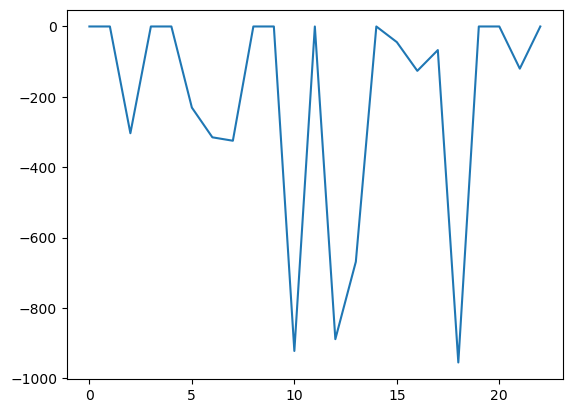

In [50]:
pd.Series(melt_energy.magnitude).plot()

# Georeference the raster data (loosely).

0,0 in the dataset is the tower C location.

In [5]:
import geopandas as gpd

In [6]:
towers_gdf = gpd.read_file("../landsat_data/towers.geojson")
towers_gdf_utm = towers_gdf.to_crs("EPSG:32613")
towers_gdf_utm

,Tower,lat,lon,alt,geometry
0,uw,38.942033,-106.972967,2863,POINT (329010.876 4312194.793)
1,ue,38.941783,-106.973250,2861,POINT (328985.717 4312167.579)
2,d,38.941733,-106.972817,2861,POINT (329023.156 4312161.217)
3,c,38.941817,-106.972983,2861,POINT (329008.911 4312170.778)


In [7]:


towers_gdf_utm.set_index('Tower').loc['c']['geometry'].y

4312170.778238215

In [8]:
ds_georef_lazy = ds_lazy.assign_coords(
    x = ds_lazy.x + towers_gdf_utm.set_index('Tower').loc['c']['geometry'].x,
    y = ds_lazy.y + towers_gdf_utm.set_index('Tower').loc['c']['geometry'].y
)

In [9]:
import rioxarray as rix

In [10]:
ds_georef_lazy.sel(time = '20230515 0000')['surface'].rio.set_crs('EPSG:32613').rio.to_raster(
    "l6_elevation_20230515_0000.tif"
)

/var/folders/x_/2h52bcjx2px15bhmdpdd748h0000gn/T/ipykernel_60344/4229416301.py:1: FutureWarning: It is recommended to use 'rio.write_crs()' instead. 'rio.set_crs()' will likelybe removed in a future release.
  ds_georef_lazy.sel(time = '20230515 0000')['surface'].rio.set_crs('EPSG:32613').rio.to_raster(


In [11]:
ds_georef_lazy.sel(time = '20230516 0000')['surface'].rio.set_crs('EPSG:32613').rio.to_raster(
    "l6_elevation_20230516_0000.tif"
)

/var/folders/x_/2h52bcjx2px15bhmdpdd748h0000gn/T/ipykernel_60344/2289327804.py:1: FutureWarning: It is recommended to use 'rio.write_crs()' instead. 'rio.set_crs()' will likelybe removed in a future release.
  ds_georef_lazy.sel(time = '20230516 0000')['surface'].rio.set_crs('EPSG:32613').rio.to_raster(


In [12]:
ds_georef_lazy.sel(time = '20230523 0000')['surface'].rio.set_crs('EPSG:32613').rio.to_raster(
    "l6_elevation_20230523_0000.tif"
)

/var/folders/x_/2h52bcjx2px15bhmdpdd748h0000gn/T/ipykernel_60344/1533808249.py:1: FutureWarning: It is recommended to use 'rio.write_crs()' instead. 'rio.set_crs()' will likelybe removed in a future release.
  ds_georef_lazy.sel(time = '20230523 0000')['surface'].rio.set_crs('EPSG:32613').rio.to_raster(


In [13]:
ds_georef_lazy.sel(time = '20230530 0000')['surface'].rio.set_crs('EPSG:32613').rio.to_raster(
    "l6_elevation_20230530_0000.tif"
)

/var/folders/x_/2h52bcjx2px15bhmdpdd748h0000gn/T/ipykernel_60344/1761824687.py:1: FutureWarning: It is recommended to use 'rio.write_crs()' instead. 'rio.set_crs()' will likelybe removed in a future release.
  ds_georef_lazy.sel(time = '20230530 0000')['surface'].rio.set_crs('EPSG:32613').rio.to_raster(


# Calculate $E_{melt}$ for the entire 2D dataset

In [ ]:
coarsened_ds_lazy = ds_lazy.surface.coarsen(dim={'x': 4, 'y': 4}).median()
differences_ds_lazy = coarsened_ds_lazy.diff(dim='time')
differences_mean = differences_ds_lazy.mean(dim=['x', 'y']).compute()
differences_median = differences_ds_lazy.median(dim=['x', 'y']).compute()

In [ ]:
differences_mean.sel(time=slice('20230510', '20230520')).cumsum().plot()
differences_median.sel(time=slice('20230510', '20230520')).cumsum().plot()

In [ ]:
from metpy.units import units
import pandas as pd

In [ ]:
snowmelt_m_per_s = differences_median / (60*60)
snow_density = 430 * units("kg/m^3")
specific_heat_of_fusion = 334 * units("kJ/kg")

melt_energy = (   
    (
        snowmelt_m_per_s.values * units("m^3/s") * snow_density * specific_heat_of_fusion
    ) / (1*units("m^2"))
).to("W/m^2")

In [ ]:
pd.Series(melt_energy.magnitude).cumsum().plot()

# Calculate $E_{melt}$ for the profile we looked at earlier

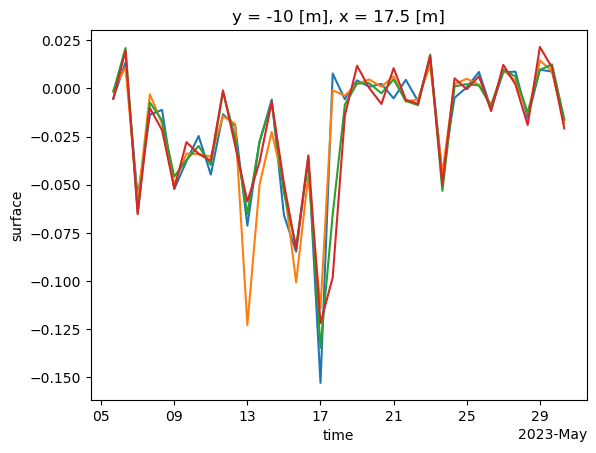

In [54]:
ds_lazy.interp(y = -10, x=10).surface.sel(time=slice(None, None, 8)).diff('time').plot()
ds_lazy.interp(y = -10, x=12.5).surface.sel(time=slice(None, None, 8)).diff('time').plot()
ds_lazy.interp(y = -10, x=15).surface.sel(time=slice(None, None, 8)).diff('time').plot()
ds_lazy.interp(y = -10, x=17.5).surface.sel(time=slice(None, None, 8)).diff('time').plot()

In [93]:
ds_lazy

<xarray.Dataset> Size: 10GB
Dimensions:    (time: 312, y: 1000, x: 1000)
Coordinates:
  * y          (y) float64 8kB -49.95 -49.85 -49.75 -49.65 ... 49.75 49.85 49.95
  * x          (x) float64 8kB -49.95 -49.85 -49.75 -49.65 ... 49.75 49.85 49.95
  * time       (time) datetime64[ns] 2kB 2023-05-05 ... 2023-05-30T22:00:00
Data variables:
    mean       (time, y, x) float64 2GB dask.array<chunksize=(1, 1000, 1000), meta=np.ndarray>
    surface    (time, y, x) float64 2GB dask.array<chunksize=(1, 1000, 1000), meta=np.ndarray>
    highpoint  (time, y, x) float64 2GB dask.array<chunksize=(1, 1000, 1000), meta=np.ndarray>
    count      (time, y, x) float64 2GB dask.array<chunksize=(1, 1000, 1000), meta=np.ndarray>

In [44]:
coarsened_profile_ds_lazy = ds_lazy.interp(y = -10).surface.sel(time=slice(None, None, 12))
differences_ds_lazy = coarsened_profile_ds_lazy.diff(dim='time')
differences_mean = differences_ds_lazy.mean(dim=['x']).compute()
differences_median = differences_ds_lazy.median(dim=['x']).compute()

In [45]:
coarsened_profile_ds_lazy

src = coarsened_profile_ds_lazy.sel(
    # x = slice(None, None, 10),
    time = slice('20230515', None)
).to_dataframe().dropna().reset_index()
src = src[np.abs(src.surface) > 0.005]
alt.Chart(src).mark_line().encode(
    alt.X('x:Q'),
    alt.Y('mean(surface):Q').scale(zero=False),
    alt.Color('date(time):O')
).properties(width=500, height=500)

alt.Chart(...)

In [38]:
src = coarsened_ds_lazy.sel(
    # x = slice(None, None, 10),
    time = slice('20230515', None)
).to_dataframe()
alt.Chart().mark_line().encode(
    alt.X('time:T'),
    alt.Y('surface:Q')
)

/var/folders/x_/2h52bcjx2px15bhmdpdd748h0000gn/T/ipykernel_12281/415030539.py:5: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  alt.Chart(src.reset_index().groupby('time').apply(lambda df: df.interpolate(x=10)).reset_index(drop=True)).mark_line().encode(


alt.Chart(...)

In [9]:
src = differences_ds_lazy.sel(x = slice(None, None, 10)).to_dataframe().dropna().reset_index()
src = src[np.abs(src.surface) > 0.005]
alt.Chart(src).mark_line().encode(
    alt.X('x:Q'),
    alt.Y('mean(surface):Q'),
    alt.Color('date(time):O')
)

alt.Chart(...)

In [ ]:
differences_mean.cumsum().plot()
differences_median.cumsum().plot()

In [ ]:
snowmelt_m_per_s = differences_median / (60*60*24)
snow_density = 430 * units("kg/m^3")
specific_heat_of_fusion = 334 * units("kJ/kg")

melt_energy = snowmelt_m_per_s.copy()
melt_energy.values = (   
    (
        snowmelt_m_per_s.values * units("m^3/s") * snow_density * specific_heat_of_fusion
    ) / (1*units("m^2"))
).to("W/m^2")

In [ ]:
melt_energy.plot()

# Try coregistering the DEM

In [ ]:
to_save = ds_lazy.sel(time = '20230515 0000').surface

In [ ]:
to_save.rio.write_crs('EPSG:32610')

In [ ]:
.rio

In [ ]:
ds_lazy.sel(time = '20230515 0000').surface.rio.to_raster('20230515.tif')

In [ ]:
ds_lazy.sel(time = '20230530 0000').surface.rio.to_raster('20230530.tif')

SWITCH ENVS

In [ ]:
import xdem

# Create a coregistration pipeline
my_coreg_pipeline = xdem.coreg.ICP() + xdem.coreg.NuthKaab()

# Or use a single method
my_coreg_pipeline = xdem.coreg.NuthKaab()


In [ ]:
ls

In [ ]:

# Open a reference and to-be-aligned DEM
ref_dem = xdem.DEM("l2_elevation_20230515_0000.tif")
tba_dem = xdem.DEM("l2_elevation_20230530_0000.tif")

In [ ]:
aligned_dem = tba_dem.coregister_3d(ref_dem, my_coreg_pipeline)

In [ ]:
dem_may15 = ref_dem.to_xarray()
dem_may30_unaligned = tba_dem.to_xarray()
dem_mat30_aligned = aligned_dem.to_xarray()

In [ ]:
plt.figure(figsize=(20,5))
dem_may15.interp(y=4312160).plot()
dem_may30_unaligned.interp(y=4312160).plot()
dem_mat30_aligned.interp(y=4312160).plot()

In [ ]:
import matplotlib.pyplot as plt
dem_may15.plot()
plt.axhline(4312150)
# interp(y=4312160).plot()

# Test if the Cloth Simulation Filter improves melt estimates

## W/ CSF: Calculate melt energy using 3 rasters produced with cloud compare

In [96]:
import rioxarray as rix

In [231]:
ds06 = rix.open_rasterio("/Users/elischwat/Downloads/lidar_20230510_dems_w_csf/2023_05_10_06.tif")
ds10 = rix.open_rasterio("/Users/elischwat/Downloads/lidar_20230510_dems_w_csf/2023_05_10_10.tif")
ds14 = rix.open_rasterio("/Users/elischwat/Downloads/lidar_20230510_dems_w_csf/2023_05_10_14.tif")
ds18 = rix.open_rasterio("/Users/elischwat/Downloads/lidar_20230510_dems_w_csf/2023_05_10_18.tif")

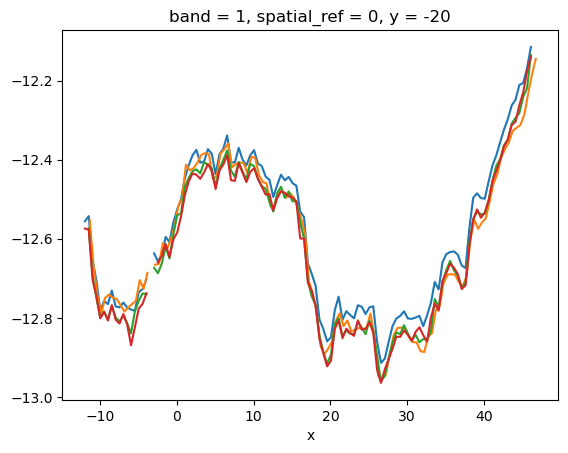

In [233]:
ds06.interp(y=-20).rolling(x=1).mean().plot()
ds10.interp(y=-20).rolling(x=1).mean().plot()
ds14.interp(y=-20).rolling(x=1).mean().plot()
ds18.interp(y=-20).rolling(x=1).mean().plot()


In [135]:
ds18_reindexed = ds18.reindex_like(
    ds06, method='nearest'
)
ds14_reindexed = ds14.reindex_like(
    ds06, method='nearest'
)
ds10_reindexed = ds10.reindex_like(
    ds06, method='nearest'
)

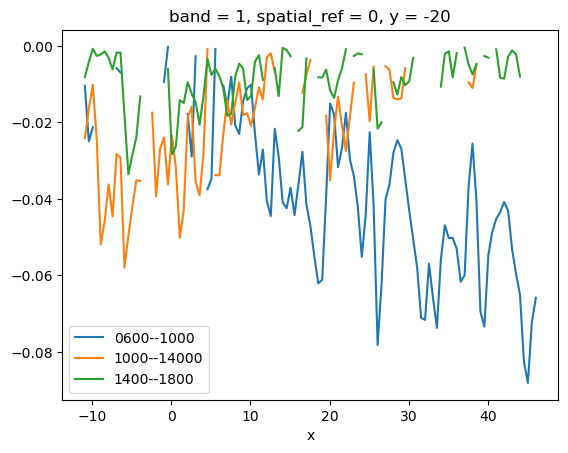

In [140]:
diff1 = (ds10_reindexed.interp(y=-20).rolling(x=2).mean() - ds06.interp(y=-20).rolling(x=2).mean())
diff1.where(diff1 < 0).plot(label = '0600--1000')

diff2 = (ds14_reindexed.interp(y=-20).rolling(x=2).mean() - ds10_reindexed.interp(y=-20).rolling(x=2).mean())
diff2.where(diff2 < 0).plot(label = '1000--14000')

diff3 = (ds18_reindexed.interp(y=-20).rolling(x=2).mean() - ds14_reindexed.interp(y=-20).rolling(x=2).mean())
diff3.where(diff3 < 0).plot(label = '1400--1800')
plt.legend()

In [147]:
melt_m_per_4hr = np.array([diff1.where(diff1 < 0).mean().item(), diff2.where(diff2 < 0).mean().item(), diff3.where(diff3 < 0).mean().item()])
melt_m_per_4hr

array([-0.0390493 , -0.02130062, -0.0087763 ])

In [150]:
snowmelt_m_per_s = melt_m_per_4hr / (60*60*4)
snow_density = 430 * units("kg/m^3")
specific_heat_of_fusion = 334 * units("kJ/kg")

melt_energy = (   
    (
        snowmelt_m_per_s * units("m^3/s") * snow_density * specific_heat_of_fusion
    ) / (1*units("m^2"))
).to("W/m^2")

In [151]:
melt_energy

Magnitude,[-389.462517192534 -212.4441293179274 -87.5313641009596]
Units,watt/meter2


## NO CSF: Calculate melt energy using 3 rasters produced by Ethan

In [ ]:
ds_lazy.sel(time = '20230510 0600').interp(y=-20).rolling(x=2).mean().surface.plot()
ds_lazy.sel(time = '20230510 1000').interp(y=-20).rolling(x=2).mean().surface.plot()
ds_lazy.sel(time = '20230510 1400').interp(y=-20).rolling(x=2).mean().surface.plot()
ds_lazy.sel(time = '20230510 1800').interp(y=-20).rolling(x=2).mean().surface.plot()

(-0.1, 0.0)

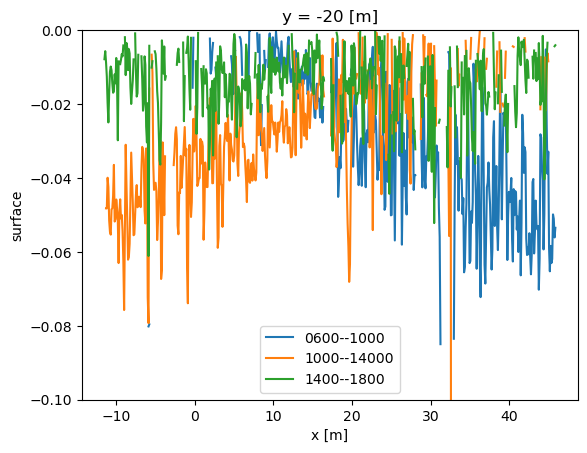

In [168]:
diff1 = (ds_lazy.sel(time = '20230510 1000').interp(y=-20).rolling(x=2).mean().surface - ds_lazy.sel(time = '20230510 0600').interp(y=-20).rolling(x=2).mean().surface)
diff1.where(diff1 < 0).plot(label = '0600--1000')

diff2 = (ds_lazy.sel(time = '20230510 1400').interp(y=-20).rolling(x=2).mean().surface - ds_lazy.sel(time = '20230510 1000').interp(y=-20).rolling(x=2).mean().surface)
diff2.where(diff2 < 0).plot(label = '1000--14000')

diff3 = (ds_lazy.sel(time = '20230510 1800').interp(y=-20).rolling(x=2).mean().surface - ds_lazy.sel(time = '20230510 1400').interp(y=-20).rolling(x=2).mean().surface)
diff3.where(diff3 < 0).plot(label = '1400--1800')
plt.legend()
plt.ylim(-0.1, 0)

In [176]:
melt_m_per_4hr = np.array([diff1.where(diff1 < 0).mean().values.item(), diff2.where(diff2 < 0).mean().values.item(), diff3.where(diff3 < 0).mean().values.item()])
melt_m_per_4hr

array([-0.02900848, -0.02989995, -0.01425954])

In [177]:
snowmelt_m_per_s = melt_m_per_4hr / (60*60*4)
snow_density = 430 * units("kg/m^3")
specific_heat_of_fusion = 334 * units("kJ/kg")

melt_energy = (   
    (
        snowmelt_m_per_s * units("m^3/s") * snow_density * specific_heat_of_fusion
    ) / (1*units("m^2"))
).to("W/m^2")

<Axes: >

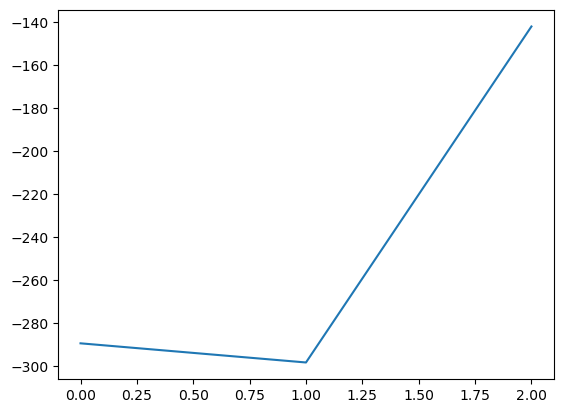

In [183]:
pd.Series(melt_energy).plot()

In [222]:
diff_2hr = ds_lazy.sel(time = '20230517').interp(y=-20).rolling(x=2).mean().surface.diff('time')
snowmelt_m_per_2hr = diff_2hr.where(diff_2hr < 0).mean('x')
snowmelt_m_per_s = (
    snowmelt_m_per_2hr.values / (60*60*2)
)
snow_density = 430 * units("kg/m^3")
specific_heat_of_fusion = 334 * units("kJ/kg")


In [229]:
melt_energy = (   
    (
        snowmelt_m_per_s * units("m^3/s") * snow_density * specific_heat_of_fusion
    ) / (1*units("m^2"))
).to("W/m^2")

melt_energy = snowmelt_m_per_2hr.copy(data = melt_energy)

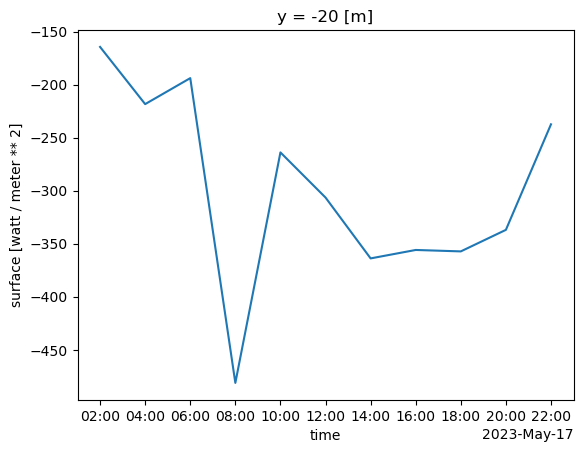

In [230]:
melt_energy.plot()

Magnitude,[-164.48719774404705 -218.39871033543784 -193.90246081450329 -481.21478265503947 -263.9143857892375 -306.4669865722502 -363.83635558275785 -355.8811435169831 -357.2333816209412 -336.93393494988766 -237.45308168195442]
Units,watt/meter2
